In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
import torchvision
import matplotlib.patches as patches
from sklearn.cluster import KMeans

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

In [2]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device


2.5.0+cu124


device(type='cuda')

In [3]:
print(torch.cuda.get_device_name(0))

NVIDIA A100-SXM4-80GB


In [4]:
similarity_matrix = lambda data : data/data.norm(dim = 1, keepdim=True) @(data/data.norm(dim = 1, keepdim=True)).T
similarity_vactor = lambda data, v : (v/(v.norm(dim = 1, keepdim=True)+1e-6) @(data/(data.norm(dim = 1, keepdim=True) +1e-6 ) ).T).flatten()

degree_matrix = lambda sim_mat : torch.diag(sim_mat.sum(dim = 1))

participation_ratio = lambda v :  (v.norm(1)**2)/v.norm(2)**2/len(v)
participation_ratio_dataset = lambda data :  (data.norm(1, dim = 1)**2)/data.norm(2,dim = 1)**2/data.shape[1]


## Load denoisers


In [5]:
denoisers = {}

root_path = '../denoisers/'

paths = { 
         'mixture-color-deep-no-skip':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',
 
        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]
    
    print('loading group ' , group )
    denoisers[group] = load_learned_model(path, print_args=True)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-deep-no-skip
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 1024
num_epochs 1500
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 1232457
imagenet_subset_ids None
data_name imagenet
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64
optional_dir_label color_no_skip_deep_dec
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 84
coarse True
self_cond False
num_kernels [64, 128, 256, 512]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [6, 6, 6]
NormType LayerNorm
inter_skip True
dilations None
data_path /mnt/home/zkadkhodaie/ceph/datasets/imagenet
******************************************************
number of parameters is  13125187
train mode: Fa

In [6]:

denoisers.keys()

dict_keys(['mixture-color-deep-no-skip'])

# Load datasets 

In [8]:
test_sets = torch.load( '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/test_64x64_color_list.pt', weights_only=True) 
# val_sets = torch.load( '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/validation_color_full_64x64_list.pt', weights_only=True) 

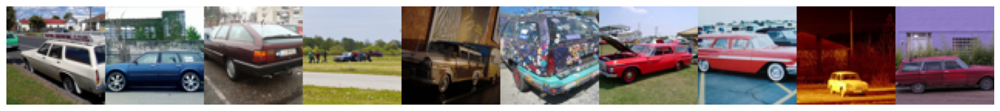

In [9]:
show_im_grid(test_sets[0][0:10] )


In [10]:
print('number of images in each class:', test_sets[0].shape)
K = test_sets[0].shape[2]
n_channels = test_sets[0].shape[1]
print(len(test_sets))

number of images in each class: torch.Size([49, 3, 64, 64])
999


tensor(0.4428)


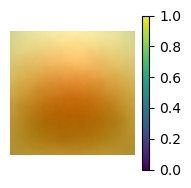

In [11]:
dist_mean = torch.concatenate(test_sets).mean(dim = (0))
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())

In [12]:
dist_mean.mean(dim = (1,2), keepdim = True)

tensor([[[0.4773]],

        [[0.4508]],

        [[0.4001]]])

In [13]:
test_sets_cat = torch.concatenate(test_sets)
test_sets_cat.shape

torch.Size([49051, 3, 64, 64])

120


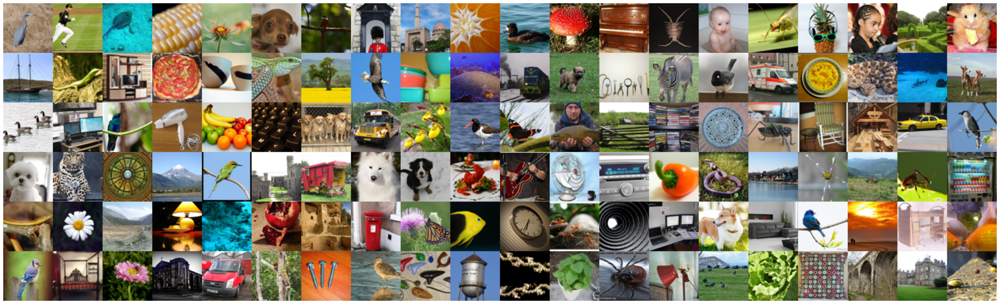

In [14]:
my_ids = [5, 31, 40, 46, 53, 58, 59,50+17, 50+45,104, 105, 117, 118, 124, 130,139 ,142, 150, 169, 179, 183, 186, 190,202, 209, 214, 229, 237, 260, 261, 275, 277, 288,291 , 307, 310, 316,336, 343,348,350,357,362,376,394,396, 
         408, 419, 440, 443, 459, 461, 486, 488,500, 524,525, 536, 546,570,572, 574, 576, 582,597, 603, 606,609, 615,622,636,651,660, 663,679,686, 692, 705,709,710,713,716,729, 746,747,752,761,763, 786,790,793,796, 
         802, 844, 846,851, 853,864,870,878,887,889, 891,  907, 909, 910, 919, 920, 921,930, 937,954, 956, 957,960, 968, 980, 992, 993,  995 ]

my_ims = torch.cat([test_sets[i][0:1] for i in my_ids ])
print(len(my_ids))
show_im_grid(my_ims, n_columns=20)
# show_im_set(my_ims, n_columns=20)

# Synthesis 

## scheduled algorithm 

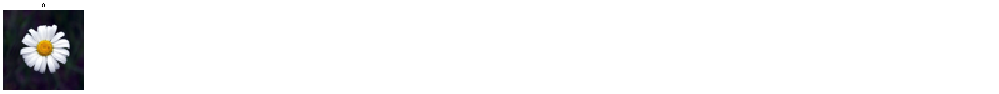

In [19]:
c = torch.randint(low=0, high=len(my_ims),size=( 1,)).item()
show_im_set(my_ims[c:c+1])


In [24]:
group = 'mixture-color-deep-no-skip'
n_samples = 8

init_ims = dist_mean.mean() * torch.ones(n_samples,n_channels,K,K) 
# im_n = torch.randint(low=0, high=len(test_sets_cat),size=( 1,)).item()

# x_c = my_ims[c:c+1]
# x_c = test_sets_cat[im_n:im_n+1]
x_c =  my_ims[c:c+1]
sigmas =torch.logspace(3,0, 100)
# sigmas = torch.linspace(3,0.03, 100 )
sig_c = None
max_iter = 100
n_noise=10
seed = None
centroids = False
max = False
sample, traj, losses = self_conditional_sampling(
                              model=denoisers[group], 
                              x= init_ims, 
                              x_c=x_c , 
                              sigmas= sigmas, 
                              sig_c=sig_c,     
                              seed= seed,  
                              skip=False,
                              n_noise=n_noise,     
                              max_iter=max_iter, 
                              centroids=centroids,
                              # phi_mask = phi_mask_emphasis_spe.to(device),
                              max=max,
                              # mask=None ,
                              lr = .01,
                              return_lists = True
                              )


------- tensor(1000.)
------- tensor(932.6033)
------- tensor(869.7490)
------- tensor(811.1309)
------- tensor(756.4633)
------- tensor(705.4802)
------- tensor(657.9332)
------- tensor(613.5907)
------- tensor(572.2368)
------- tensor(533.6699)
------- tensor(497.7024)
------- tensor(464.1589)
------- tensor(432.8761)
------- tensor(403.7017)
------- tensor(376.4936)
------- tensor(351.1192)
------- tensor(327.4549)
------- tensor(305.3856)
------- tensor(284.8036)
------- tensor(265.6088)
------- tensor(247.7076)
------- tensor(231.0130)
------- tensor(215.4435)
------- tensor(200.9233)
------- tensor(187.3817)
------- tensor(174.7528)
------- tensor(162.9751)
------- tensor(151.9911)
------- tensor(141.7474)
------- tensor(132.1941)
------- tensor(123.2847)
------- tensor(114.9757)
------- tensor(107.2267)
------- tensor(100.)
------- tensor(93.2603)
------- tensor(86.9749)
------- tensor(81.1131)
------- tensor(75.6463)
------- tensor(70.5480)
------- tensor(65.7933)
------- tenso

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


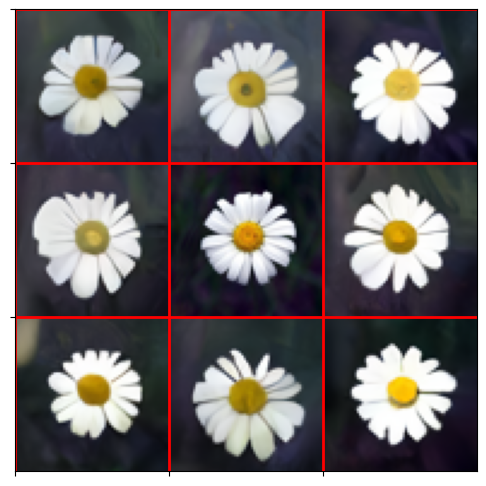

keep all channels


In [185]:
show_im_grid(torch.cat((sample.cpu()[0:4] , x_c, sample.cpu()[4:8] )), n_columns=3, grid_lines=True);
print('keep all channels')

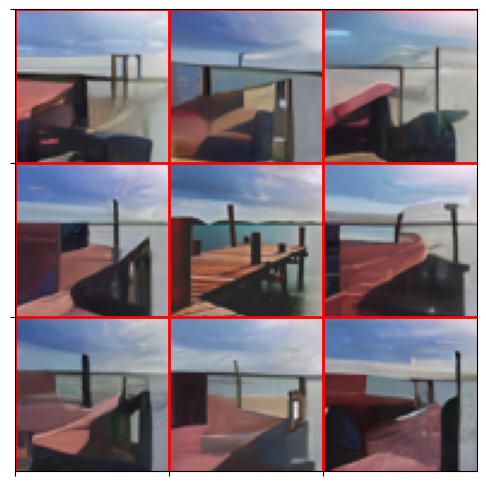

In [1310]:
show_im_grid(torch.cat((sample.cpu()[0:4] , x_c, sample.cpu()[4:8] )), n_columns=3, grid_lines=True);

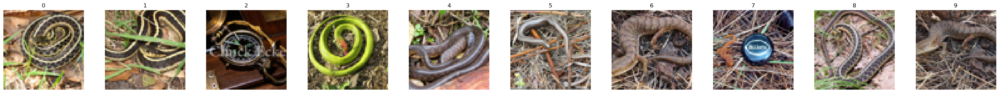

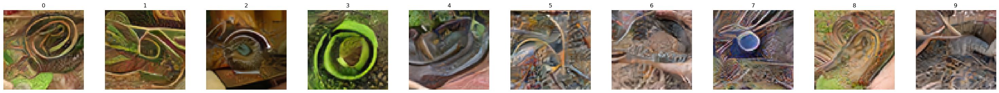

None
100 max_iter: 100 centroid False max False


In [673]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter, 'centroid',centroids, 'max', max);

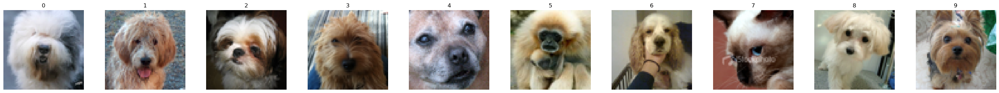

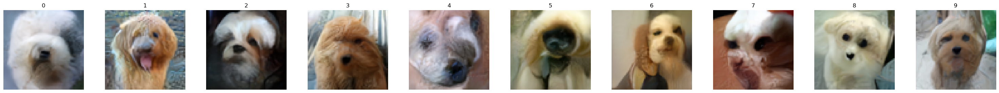

None
100 max_iter: 100 centroid False max False


In [642]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter, 'centroid',centroids, 'max', max);

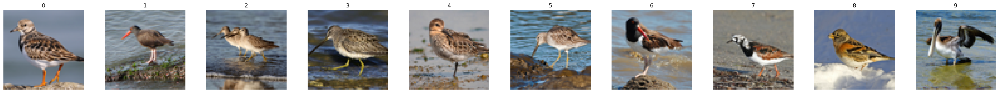

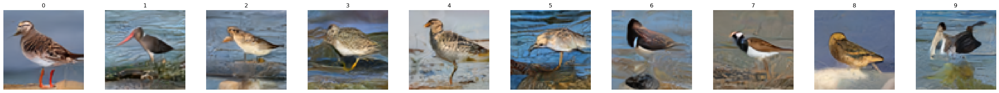

None
100 max_iter: 100 centroid False max False


In [608]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter, 'centroid',centroids, 'max', max);

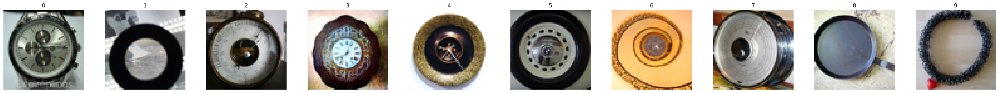

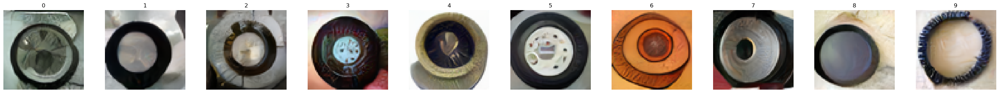

None
100 max_iter: 100 centroid False max False


In [581]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter, 'centroid',centroids, 'max', max);

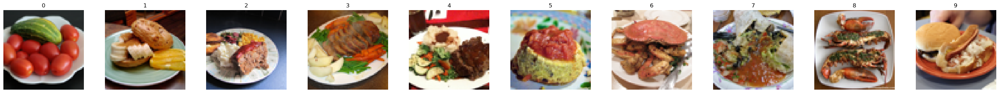

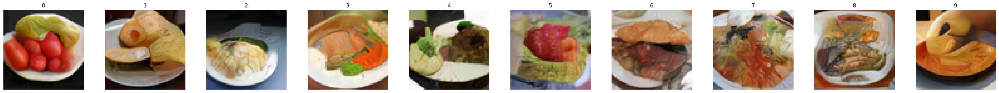

None
100 max_iter: 100


In [538]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

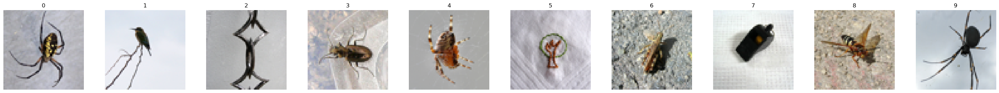

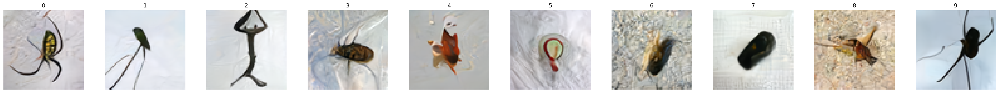

None
100 max_iter: 100


In [527]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

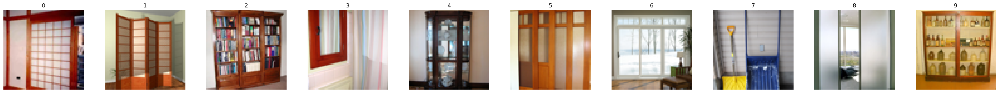

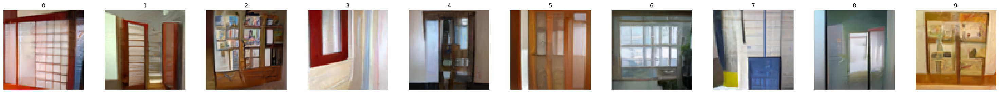

None
100 max_iter: 100


In [521]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

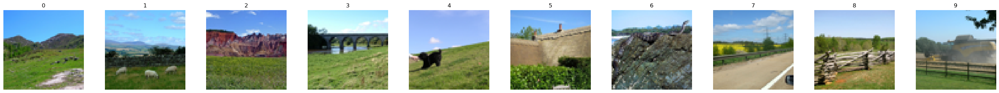

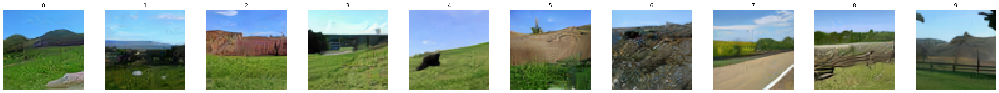

None
100 max_iter: 100


In [497]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

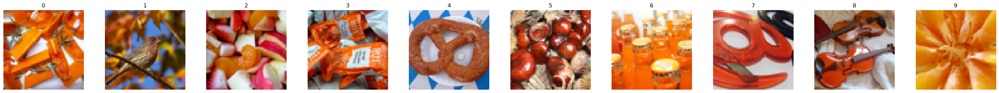

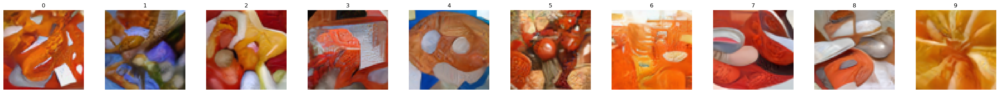

None
100 max_iter: 100


In [487]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

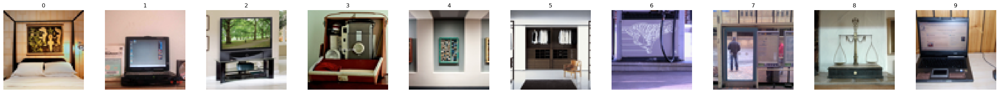

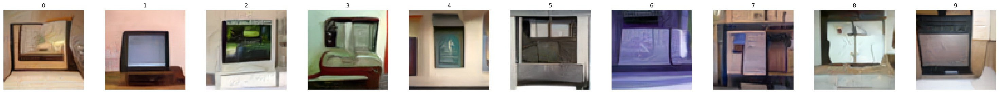

None
100 max_iter: 100


In [477]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

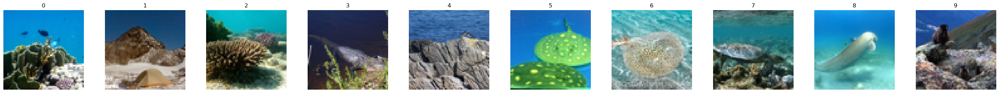

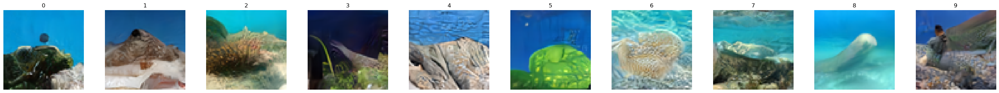

None
100 max_iter: 100


In [469]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

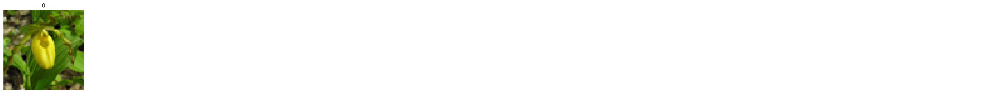

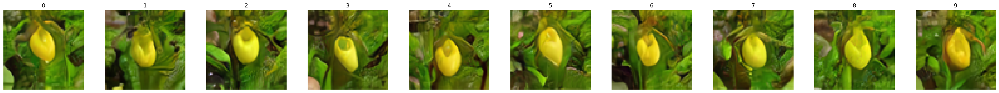

None
100 max_iter: 100


In [449]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

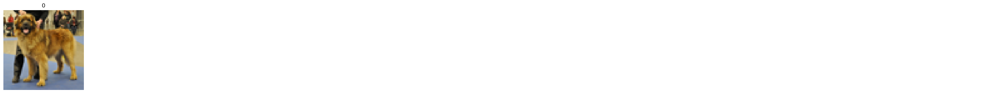

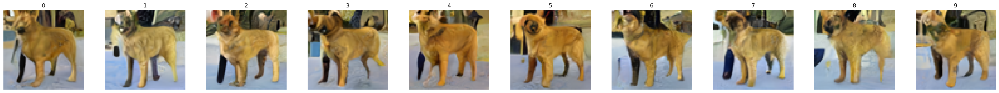

None
100 max_iter: 100


In [405]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

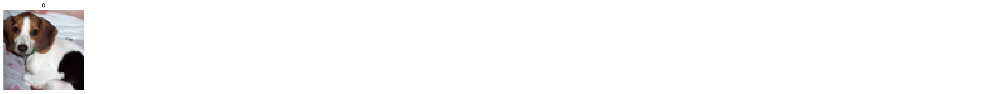

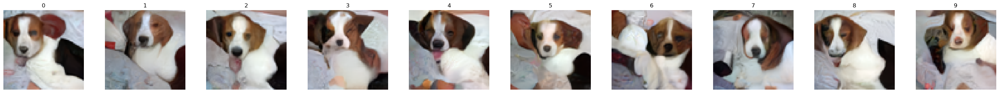

None
100 max_iter: 100


In [391]:
show_im_set(x_c, n_columns=10)
show_im_set(sample, n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

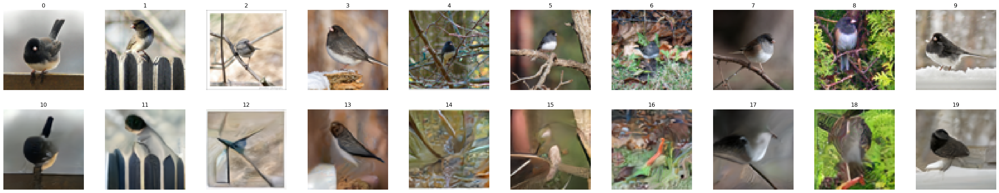

None
100 max_iter: 100


In [355]:
show_im_set(torch.cat((x_c,sample.cpu())), n_columns=10)
print(sig_c)
print(len(sigmas), 'max_iter:',max_iter);

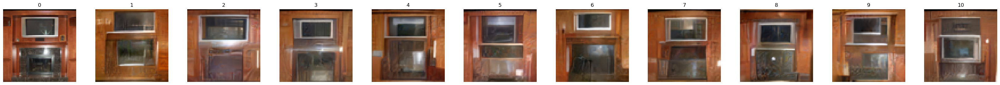

In [173]:
# linear schedule 
show_im_set(torch.cat((x_c,sample.cpu())), n_columns=11)

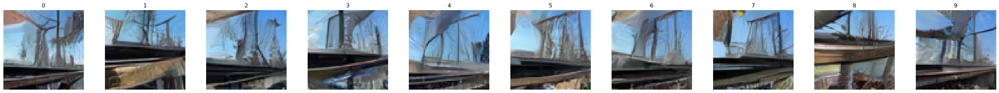

In [313]:

show_im_set(sample, n_columns=10)

# Effect of matching on denoising 

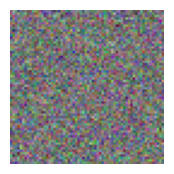

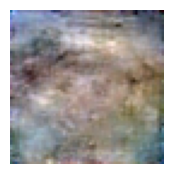

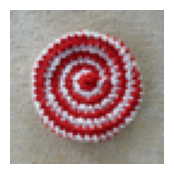

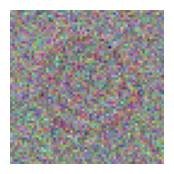

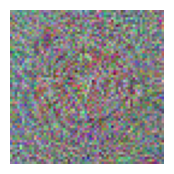

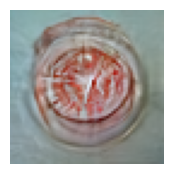

In [1500]:
group = 'mixture-color-deep-no-skip'
c =   802
# c = torch.randint(low=0, high=len(test_sets),size=( 1,)).item()

x_c = test_sets[ c][4:5]
target_phi = phi_c_noise_averaged(model=denoisers[group], x_c = x_c, sigs = torch.tensor([1]).reshape(1,1,1,1), n_noise = 10)


x = torch.ones((1,3,64,64))*.5
noise = torch.randn_like(x) * .1
x_matched , losses = match_phis_mid_block(model=denoisers[group], 
                     x_noisy =  x+ noise , 
                     target_phi= target_phi, 
                     max_iter=200, 
                     lr=0.01)

plot_single_im(( (x+ noise).cuda()) )
plot_single_im(denoisers[group]( (x+ noise).cuda()))

plot_single_im(x_c  )
plot_single_im(x_c  + torch.randn_like(x))
plot_single_im(x_matched )
plot_single_im(denoisers[group](x_matched.cuda()))


## Does matching change the noise level? 

In [1511]:
group = 'mixture-color-deep-no-skip'
# c =   802
ids = torch.randint(low=0, high=len(test_sets),size=( batch_size,))

batch_size = 20
x_c = test_sets_cat[ids]
sigs_before = []
sigs_after = []

target_phi = phi_c_noise_averaged(model=denoisers[group], 
                                  x_c = x_c, 
                                  sigs = .5 * torch.ones(batch_size).reshape(x_c.shape[0],1,1,1), 
                                  n_noise = 20)

for sig in np.linspace(0,1, 20):
    
    x = torch.ones((batch_size,n_channels,K,K))*.5
    # x = test_sets[ torch.randint(low=0, high=len(test_sets),size=( 1,)).item()][0:batch_size]
    x_noisy = x+ torch.randn_like(x) * sig
    
    ## estimate noise before matching 
    score_x_noisy =x_noisy.cuda() -  denoisers[group](x_noisy.cuda())
    sigma_x_noisy = torch.norm(score_x_noisy, dim=(2,3),keepdim=True).norm(dim=1,keepdim=True)/np.sqrt(n_channels * K * K)
    sigs_before.append(sigma_x_noisy.flatten().cpu() ) 
    
    
    ## estimate noise after  matching 
    
    x_matched , losses = match_phis_mid_block(model=denoisers[group], 
                         x_noisy =  x_noisy, 
                         target_phi= target_phi, 
                         max_iter=200, 
                         lr=0.01)
    
    score_x_matched =x_matched.cuda() -  denoisers[group](x_matched.cuda())
    sigma_x_matched = torch.norm(score_x_matched, dim=(2,3),keepdim=True).norm(dim=1,keepdim=True)/np.sqrt(n_channels * K * K)
    
    
    sigs_after.append(sigma_x_matched.flatten().cpu() ) 

    


Text(0, 0.5, ' $\\sigma$ after matching ')

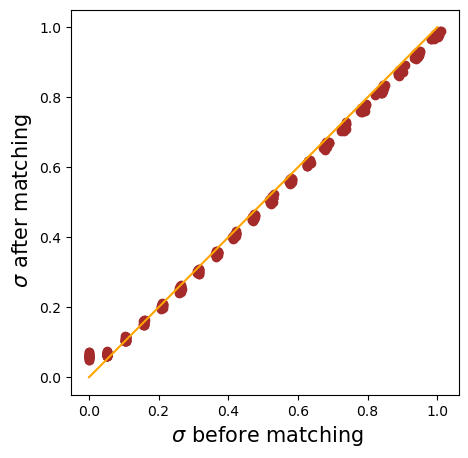

In [1512]:
plt.figure(figsize = (5,5))
plt.plot([0,1], [0,1], color = 'orange')
plt.scatter( torch.cat(sigs_before), torch.cat(sigs_after), marker = 'o', color = 'brown' )
plt.xlabel(' $\sigma$ before matching ', fontsize =15 )
plt.ylabel(' $\sigma$ after matching ', fontsize =15 )

Text(0, 0.5, ' $\\sigma$ after matching ')

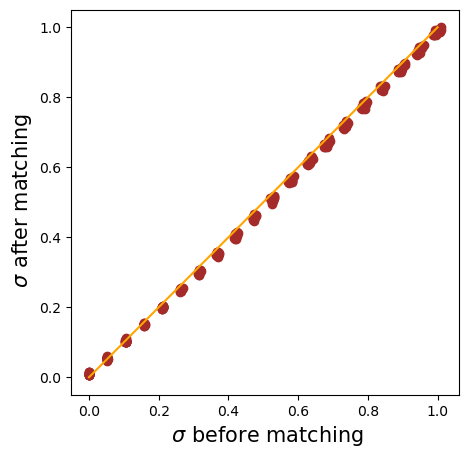

In [1470]:
plt.figure(figsize = (5,5))
plt.plot([0,1], [0,1], color = 'orange')
plt.scatter( torch.cat(sigs_before), torch.cat(sigs_after), marker = 'o', color = 'brown' )
plt.xlabel(' $\sigma$ before matching ', fontsize =15 )
plt.ylabel(' $\sigma$ after matching ', fontsize =15 )